In [9]:
#Subreddit here


In [27]:
#new - this is not used for now
import praw
import pandas as pd

# Initialize Reddit
reddit = praw.Reddit(client_id='DWa7G4qau_h6_1x1vUfnrw',
                     client_secret='3eHdDvcxtxes2z3AjKQvYAuNr527Qg',
                     user_agent='projectAPI')

# Prepare a list for storing data
data = []

# Choose subreddit
subreddit_names = ['OnePiece', 'Naruto', 'dbz', 'OnePunchMan', 'ShingekiNoKyojin', 'JuJutsuKaisen', 'BokuNoHeroAcademia', 'HunterXHunter', 'Berserk', 'sololeveling', 'bleach', 'BlackClover', 'SpyxFamily', 'ChainsawMan', 'deathnote']
for name in subreddit_names:
    subreddit = reddit.subreddit(name)
    for post in subreddit.hot(limit=20):  # Adjust limit as needed
        if post.author:
            post_username = post.author.name
        else:
            post_username = 'deleted user'
        
        # Fetch all comments and replies
        post.comments.replace_more(limit=0)
        comments_list = []
        for comment in post.comments.list():
            if comment.author:
                comment_username = comment.author.name
            else:
                comment_username = 'deleted user'
            
            # Fetch replies
            replies_list = []
            for reply in comment.replies:
                if reply.author:
                    reply_author = reply.author.name
                else:
                    reply_author = 'deleted user'
                replies_list.append(reply_author)
            
            # Combine comment author with their replies
            comments_list.append([comment_username, replies_list])
        
        # Append post data with nested comments
        data.append({
            'Subreddit': name,
            'Title': post.title,
            'PostAuthor': post_username,
            'CommentAuthors': comments_list
        })

# Convert list to DataFrame
df = pd.DataFrame(data)

print(df.shape)  
print(df.head())  # Print first few rows to check

# Export to CSV
df.to_csv('reddit_comments_replies.csv', index=False, encoding='utf-8')


(300, 4)
  Subreddit                                              Title  \
0  OnePiece              One Piece: Chapter 1108 - Predictions   
1  OnePiece        /r/OnePiece Monthly AI-Generated Art thread   
2  OnePiece  why is the internet acting like Zoro is weak a...   
3  OnePiece  Just my friend crying while watching the maste...   
4  OnePiece   Whats the Most disrespectful panels in one piece   

        PostAuthor                                     CommentAuthors  
0    AutoModerator  [[Blepple, [YasuotheChosenOne, Luffy_Is_A_Plan...  
1    AutoModerator  [[AdhesiveHagfish, []], [Scoogs50, []], [Senip...  
2    Low-Wash-4036  [[DargoKillmar, [kakathicc, AlexTheNotSoGreat0...  
3  Andrewandreioka  [[aLittleDarkOne, [SSBB_, HulklingsBoyfriend, ...  
4          dodly32  [[carbonera99, [LaughinBaratheon028, Peklet, I...  


In [30]:
import praw

import pandas as pd


# Initialize Reddit
reddit = praw.Reddit(client_id='DWa7G4qau_h6_1x1vUfnrw',
                     client_secret='3eHdDvcxtxes2z3AjKQvYAuNr527Qg',
                     user_agent='projectAPI')

# Lists to store data
posts_data = []
comments_data = []
title = []
post_author = []
comment_authors = []

#represent in a dataframe    
df = pd.DataFrame(columns=['Subreddit','Title','PostAuthor','CommentAuthors'])

# Choose subreddit
subreddit_names = ['OnePiece', 'Naruto', 'dbz', 'OnePunchMan', 'ShingekiNoKyojin', 'JuJutsuKaisen','BokuNoHeroAcademia','HunterXHunter','Berserk','sololeveling','bleach','BlackClover','SpyxFamily','ChainsawMan','deathnote']
for names in subreddit_names:
    subreddit = reddit.subreddit(names)
    # Fetch posts
    comment_count = 0
    all_comments = []
    for post in subreddit.hot(limit=25):  # Adjust limit as needed
        number_of_comments = len(post.comments.list())
        #print("Post ID:", post.id, "| Title:", post.title)
        if not post.author:
            post_username = 'deleted user'
        else:
            post_username = post.author.name
    
    #Comments
       
        post.comments.replace_more(limit=0)  # Load all comments
        for comment in post.comments.list():
            if not comment.author:
                comment_username = 'deleted user'
            else:
                comment_username = comment.author.name
            
            #print("\tComment by:", comment_username, "| Comment ID:", comment.id, "| Comment:", comment.body[:30])
            reply_authors = []
            for second_level_comment in comment.replies:
                if not second_level_comment.author:
                    second_level_comment_username = 'deleted user'
                else:
                    second_level_comment_username = second_level_comment.author.name
                reply_authors.append(second_level_comment_username)

            comment_authors.append([comment_username,reply_authors])
            
            title.append(post.title)
            post_author.append(post_username)
            all_comments.append(comment_authors)
            df.loc[len(df)] = [names,post.title,post_username,comment_authors[-1]]



print(df.shape)  
print(df)
df.to_csv('exported_dataframe.csv', index=False, encoding='utf-8')


    



(21214, 4)
       Subreddit                                              Title  \
0       OnePiece              One Piece: Chapter 1108 - Predictions   
1       OnePiece              One Piece: Chapter 1108 - Predictions   
2       OnePiece              One Piece: Chapter 1108 - Predictions   
3       OnePiece              One Piece: Chapter 1108 - Predictions   
4       OnePiece              One Piece: Chapter 1108 - Predictions   
...          ...                                                ...   
21209  deathnote  How long can you control someone's actions wit...   
21210  deathnote  How long can you control someone's actions wit...   
21211  deathnote  How long can you control someone's actions wit...   
21212  deathnote  How long can you control someone's actions wit...   
21213  deathnote  How long can you control someone's actions wit...   

          PostAuthor                                     CommentAuthors  
0      AutoModerator  [Blepple, [YasuotheChosenOne, Luffy_Is_A

In [94]:
# print(all_comments)
#         comment_count += 1  
#     print("this is number of comments", len(post.comments.list()))
# print(comment_authors)
# submission.comments.replace_more(limit=None)
# for top_level_comment in submission.comments:
#         # if not top_level_comment.author:
#             top_level_comment_username = 'deleted user'
#         else:
#             top_level_comment_username = top_level_comment.author.name

#         print("This is level 1 comment",top_level_comment_username)
#         print("")
#         for second_level_comment in top_level_comment.replies:
#             if not top_level_comment.author:
#                 second_level_comment_username = 'deleted user'
#             else:
#                 second_level_comment_username = second_level_comment.author.name
#             print(second_level_comment_username)

This is level 1 comment jack3tp0tat0

rudedog1234
aklimilka
ScrapeWithFire
soragorilla69
SteIIar-Remnant
SlumClogMillionaire
GooglyTocks
Ok_Ad_8812
KinoHiroshino
justking1414
robart_
This is level 1 comment HokageEzio

OfficiAldark
Hagan3n0
LeapYearFriend
Saint_Genghis
This is level 1 comment Milordserene

Gaurav-07
Saint_Genghis
Hnnnnnn
This is level 1 comment heat_fan_

DOKOD
aklimilka
le_trans_alt
This is level 1 comment megasean3000

Hour_Career9797
glubs9
This is level 1 comment aklimilka

Ginko2046
This is level 1 comment Cauliflower_Clear

Sphyder69420
zroach
umbrazno
Interesting-Sale-651
wthrudoin
This is level 1 comment rntopspin100

HMKS
IRefuseThisNonsense
This is level 1 comment HMKS

Responsible_Safety16
This is level 1 comment serj_odama

Ice_Bean
This is level 1 comment No_Chemistry3922

ultibman5000
This is level 1 comment HMKS

luckyd1998
ASCIt
This is level 1 comment BiDiTi

This is level 1 comment DaveTheArakin

This is level 1 comment 320th-Century

ReadAccount
This

In [44]:
from collections import defaultdict

# Initialize a dictionary to hold user data
user_subreddits = defaultdict(lambda: {'count': 0, 'subreddits': set()})

for index, row in df.iterrows():
    # Track the post author
    user_subreddits[row['PostAuthor']]['count'] += 1
    user_subreddits[row['PostAuthor']]['subreddits'].add(row['Subreddit'])

    # Track comment authors and reply authors
    for comment_author_replies in row['CommentAuthors']:
        # Ensure comment_author_replies is a list with at least one element (the main comment author)
        if isinstance(comment_author_replies, list) and len(comment_author_replies) > 0:
            main_author = comment_author_replies[0]  # Main comment author
            user_subreddits[main_author]['count'] += 1
            user_subreddits[main_author]['subreddits'].add(row['Subreddit'])

            # Check if there are reply authors and they are in a list
            if len(comment_author_replies) > 1 and isinstance(comment_author_replies[1], list):
                for reply_author in comment_author_replies[1]:
                    user_subreddits[reply_author]['count'] += 1
                    user_subreddits[reply_author]['subreddits'].add(row['Subreddit'])

# Convert to DataFrame
users_data = []
for user, data in user_subreddits.items():
    if len(data['subreddits']) > 1:  # Users appearing in multiple subreddits
        users_data.append([user, data['count'], ", ".join(data['subreddits'])])

df_users_in_multiple_subreddits = pd.DataFrame(users_data, columns=['User', 'Occurrences', 'Subreddits'])

df_users_in_multiple_subreddits = df_users_in_multiple_subreddits.loc[~df_users_in_multiple_subreddits['User'].isin(['AutoModerator', 'deleted user'])]

print(df_users_in_multiple_subreddits)
df_users_in_multiple_subreddits.to_csv('optimized_new.csv', index=False, encoding='utf-8')

                    User  Occurrences  \
1                 Mawnix            4   
2              Su_Impact            5   
3                 Starob            3   
4        icantplaynomore           12   
5                Soul699            3   
..                   ...          ...   
106  PitchOutrageous1563            2   
107       SartieeSquared            2   
108      Jaegerjaquez_VI            2   
109           AGamingGuy            3   
110             IC2Flier            3   

                                    Subreddits  
1                            Berserk, OnePiece  
2                 BokuNoHeroAcademia, OnePiece  
3                                dbz, OnePiece  
4                            Berserk, OnePiece  
5    OnePunchMan, BokuNoHeroAcademia, OnePiece  
..                                         ...  
106                            Berserk, bleach  
107                      Berserk, sololeveling  
108                       sololeveling, bleach  
109              

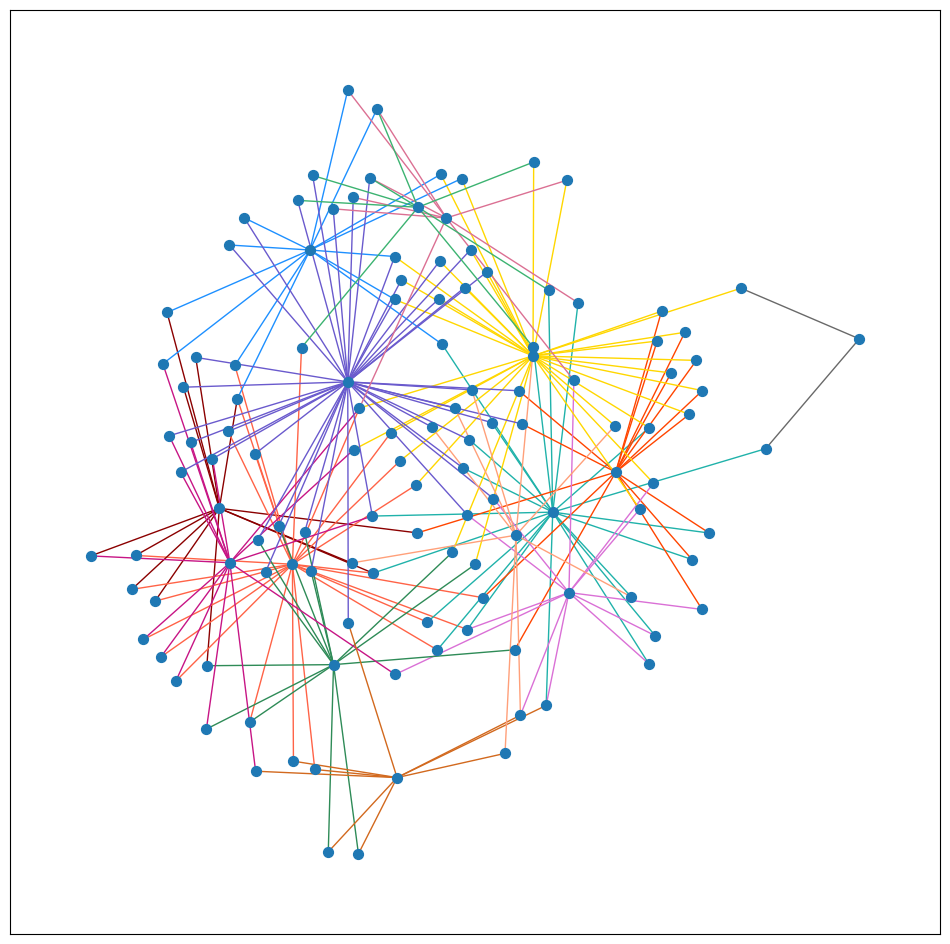

In [79]:
#this isncludes subreddits as nodes so not using this

import networkx as nx

import matplotlib.pyplot as plt

# If your `df_users_in_multiple_subreddits` DataFrame includes the necessary connection info,
# make sure it's being read correctly.
df_users = pd.read_csv('optimized_new.csv')

# Generating a new graph
G = nx.Graph()

# Let's define a color mapping for the subreddit as a form of color-coding the layouts.
subreddit_colors = {
    'OnePiece': '#FF6347',  # Tomato
    'Naruto': '#FFD700',  # Gold
    'dbz': '#FF4500',  # OrangeRed
    'OnePunchMan': '#DA70D6',  # Orchid
    'ShingekiNoKyojin': '#2E8B57',  # SeaGreen
    'JuJutsuKaisen': '#6A5ACD',  # SlateBlue
    'BokuNoHeroAcademia': '#20B2AA',  # LightSeaGreen
    'HunterXHunter': '#DB7093',  # PaleVioletRed
    'Berserk': '#8B0000',  # DarkRed
    'sololeveling': '#C71585',  # MediumVioletRed
    'bleach': '#1E90FF',  # DodgerBlue
    'BlackClover': '#3CB371',  # MediumSeaGreen
    'SpyxFamily': '#FFA07A',  # LightSalmon
    'ChainsawMan': '#D2691E',  # Chocolate
    'deathnote': '#696969',  # DimGray
}


# We will enumerate your users data to create user nodes and the member edges to subreddits.
for _, row in df_users.iterrows():
    user = row['User']
    if G.has_node(user) is False:  # Omit this line and condition if the issue of doubling doesn't arise
        G.add_node(user, bipartite=0, type='user')
    subreddits = row['Subreddits'].split(', ')
    for subreddit in subreddits:
        if G.has_node(subreddit) is False:  # Subreddit node check
            G.add_node(subreddit, bipartite=1, type='subreddit')
        # Define the color for the user-subreddit mapping
        color = subreddit_colors.get(subreddit, 'k')  # default to black if not in dict
        G.add_edge(user, subreddit, color=color)

# Positions. You may want to customize layout for clarity, e.g., using bipartite layout
pos = nx.spring_layout(G, seed=42)

# Here, we'll diverge the color logic into edges for extension
edge_colors = [G[u][v]['color'] for u, v in G.edges()]

# Visualization
plt.figure(figsize=(12, 12))
nx.draw_networkx_nodes(G, pos, node_size=50)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors)
plt.show()


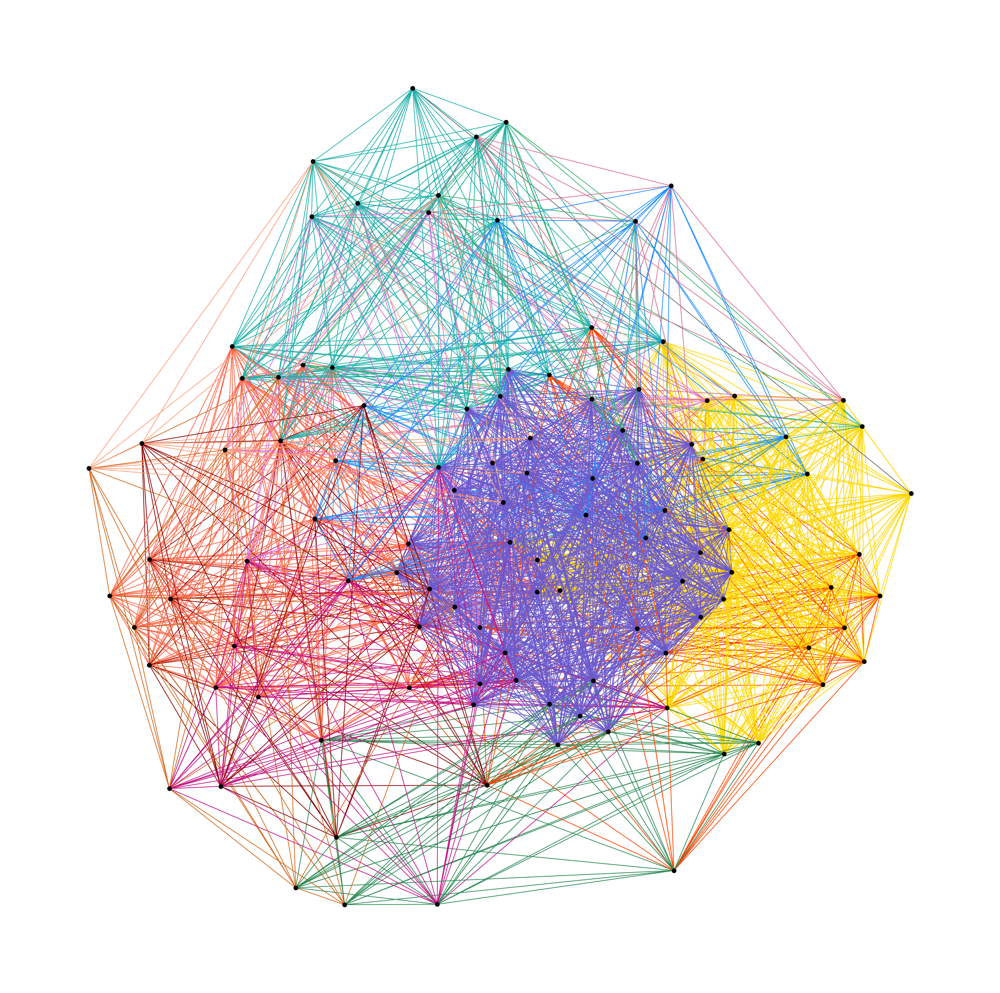

In [77]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'df_users_in_multiple_subreddits' DataFrame is prepared as before
# and you have a CSV file that maps users to subreddits correctly.

df_users = pd.read_csv('optimized_new.csv')

# Generating a new graph
G = nx.Graph()

# Define colors for each subreddit
subreddit_colors = {
    'OnePiece': '#FF6347',  # Tomato
    'Naruto': '#FFD700',  # Gold
    'dbz': '#FF4500',  # OrangeRed
    'OnePunchMan': '#DA70D6',  # Orchid
    'ShingekiNoKyojin': '#2E8B57',  # SeaGreen
    'JuJutsuKaisen': '#6A5ACD',  # SlateBlue
    'BokuNoHeroAcademia': '#20B2AA',  # LightSeaGreen
    'HunterXHunter': '#DB7093',  # PaleVioletRed
    'Berserk': '#8B0000',  # DarkRed
    'sololeveling': '#C71585',  # MediumVioletRed
    'bleach': '#1E90FF',  # DodgerBlue
    'BlackClover': '#3CB371',  # MediumSeaGreen
    'SpyxFamily': '#FFA07A',  # LightSalmon
    'ChainsawMan': '#D2691E',  # Chocolate
    'deathnote': '#696969',  # DimGray
}

# Add nodes
for user in df_users['User']:
    G.add_node(user, type='user')

# Add edges
for i, row_i in df_users.iterrows():
    user_i = row_i['User']
    subreddits_i = set(row_i['Subreddits'].split(', '))
    for j, row_j in df_users.iterrows():
        if i < j:  # Ensure each pair is processed only once
            user_j = row_j['User']
            subreddits_j = set(row_j['Subreddits'].split(', '))
            shared_subreddits = subreddits_i.intersection(subreddits_j)
            #print(shared_subreddits)
            
            for subreddit in shared_subreddits:
               # print (user_i,user_j,subreddit)
                # Add an edge for each shared subreddit
                G.add_edge(user_i, user_j, color=subreddit_colors[subreddit], label=subreddit)


# Assuming G is your pre-defined graph
# Initialize the circular layout
pos = nx.spring_layout(G, seed=109)

# Drawing the graph using the circular layout
plt.figure(figsize=(50, 50))  # Adjust figure size to your preference

# Draw nodes
nx.draw_networkx_nodes(G, pos,node_color='black', node_size=150)

# Draw edges
edges = G.edges(data=True)
edge_colors = [edge[2]['color'] for edge in edges]  # Extract color from edge attribute
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=2)



plt.axis('off')  # Turn off the axis
plt.show()


In [78]:
# Retrieving the count of nodes and edges
number_of_nodes = G.number_of_nodes()
number_of_edges = G.number_of_edges()

print(f"Total Nodes in the Graph: {number_of_nodes}")
print(f"Total Edges in the Graph: {number_of_edges}")

Total Nodes in the Graph: 109
Total Edges in the Graph: 2175
